# Tugas 1
Carilah Gambar sesuai dengan tema kalian, lalu berikan:
1. Kecerahan gambar sebanyak 50%.
2. Ukuran 300x300 pixel agar konsisten
3. berikan border hitam dengan lebar 20 pixel agar lebih rapi
4. fotonya lebih tajam dari sebelumnya.
5. ubah warna gambar menjadi grayscale
6. Tambahkan watermark/annotate nama kalian di ujung kanan gambar. Gambar yang sudah diedit disimpan dalam perangkat pribadi
7. Tampilkan perbandingan antara gambar asli dan gambar hasil manipulasi (kreasikan bagian ini sekreatif mungkin dengan syarat masih menerapkan konsep paradigma fungsional, bisa berupa high order function, closure, atau decorator).

Ukuran gambar asli: (2020, 2020)


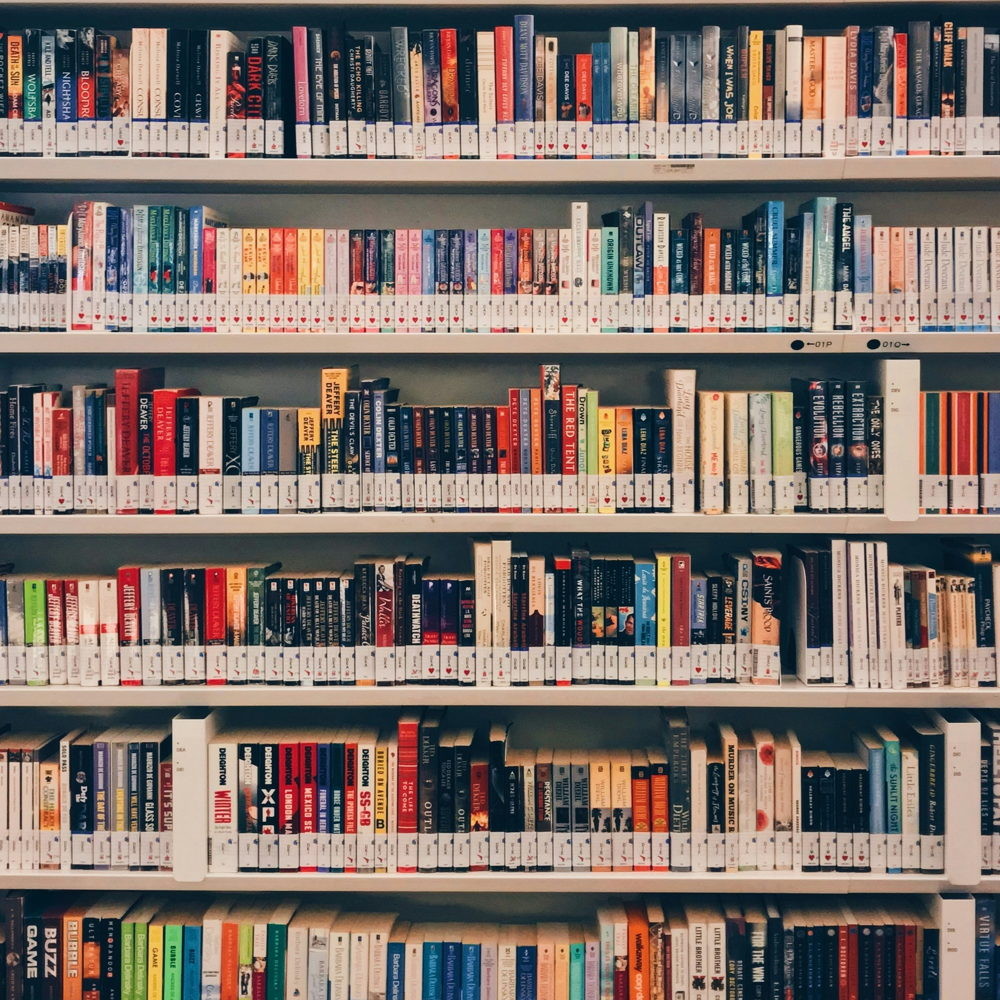

In [1]:
from pathlib import Path
from PIL import Image, ImageEnhance, ImageFilter, ImageOps, ImageDraw, ImageFont
import matplotlib.pyplot as plt

# Path ke gambar
base_dir = Path(".")
source_path = base_dir / "library.jpg"
output_path = base_dir / "library_processed.png"

# Load gambar asli
source_img = Image.open(source_path)
print(f"Ukuran gambar asli: {source_img.size}")
source_img

Gambar hasil disimpan di: library_processed.png
Ukuran gambar hasil: (300, 300)

Total langkah transformasi: 7


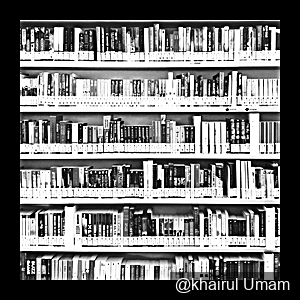

In [ ]:
def pipeline(img, steps):
    result = img.copy()
    for step in steps:
        result = step(result)
    return result

# Konstanta
TARGET_SIZE = 300
BORDER = 20
INNER_SIZE = TARGET_SIZE - 2 * BORDER
WATERMARK_TEXT = "@khairul Umam"

# 1. Kecerahan +50% (1.5x)
def adjust_brightness(factor=1.5):
    return lambda im: ImageEnhance.Brightness(im).enhance(factor)

# 2. Resize ke 300x300 (inner size 260x260 sebelum border)
def resize_square(size=INNER_SIZE):
    return lambda im: im.resize((size, size), Image.Resampling.LANCZOS).copy()

# 3. Border hitam 20 pixel
def add_border(border=BORDER, color="black"):
    return lambda im: ImageOps.expand(im, border=border, fill=color)

# 4. Sharpen (membuat lebih tajam)
def sharpen(level=1):
    def _sharpen(im):
        return im.filter(ImageFilter.UnsharpMask(radius=2 * level, percent=150, threshold=3))
    return _sharpen

# 5. Grayscale
def to_grayscale():
    return lambda im: im.convert("L").convert("RGB")

# 6. Watermark di ujung kanan
def add_watermark(text=WATERMARK_TEXT, pad=10):
    def _watermark(im):
        img_copy = im.copy()
        draw = ImageDraw.Draw(img_copy, 'RGBA')
        
        try:
            font = ImageFont.truetype("arial.ttf", 16)
        except:
            font = ImageFont.load_default()
        
        try:
            bbox = draw.textbbox((0, 0), text, font=font)
            text_w = bbox[2] - bbox[0]
            text_h = bbox[3] - bbox[1]
        except:
            text_w, text_h = draw.textsize(text, font=font)
        
        x = img_copy.width - text_w - pad
        y = img_copy.height - text_h - pad
        
        overlay = Image.new('RGBA', img_copy.size, (0, 0, 0, 0))
        overlay_draw = ImageDraw.Draw(overlay)
        overlay_draw.rectangle(
            [x - 5, y - 3, x + text_w + 5, y + text_h + 3],
            fill=(0, 0, 0, 128)
        )
        img_copy = Image.alpha_composite(img_copy.convert('RGBA'), overlay)
        img_copy = img_copy.convert('RGB')
        
        draw = ImageDraw.Draw(img_copy)
        draw.text((x, y), text, fill=(255, 255, 255), font=font)
        
        return img_copy
    
    return _watermark

def pipeline_with_steps(img, steps, step_names):
    result = img.copy()
    step_results = [("Gambar Asli", result.copy())]
    
    for step, name in zip(steps, step_names):
        result = step(result)
        step_results.append((name, result.copy()))
    
    return result, step_results

step_names = [
    "1. Kecerahan +50%",
    "2. Ukuran 300x300px",
    "3. Border Hitam 20px",
    "4. Lebih Tajam",
    "5. Grayscale",
    "6. Hasil Akhir (Watermark)"
]

steps = [
    adjust_brightness(1.5),      
    resize_square(),             
    add_border(),              
    sharpen(1),                  
    to_grayscale(),              
    add_watermark(),            
]

processed_img, all_steps = pipeline_with_steps(source_img, steps, step_names)
processed_img.save(output_path)
print(f"Gambar hasil disimpan di: {output_path}")
print(f"Ukuran gambar hasil: {processed_img.size}")
print(f"\nTotal langkah transformasi: {len(all_steps)}")

processed_img

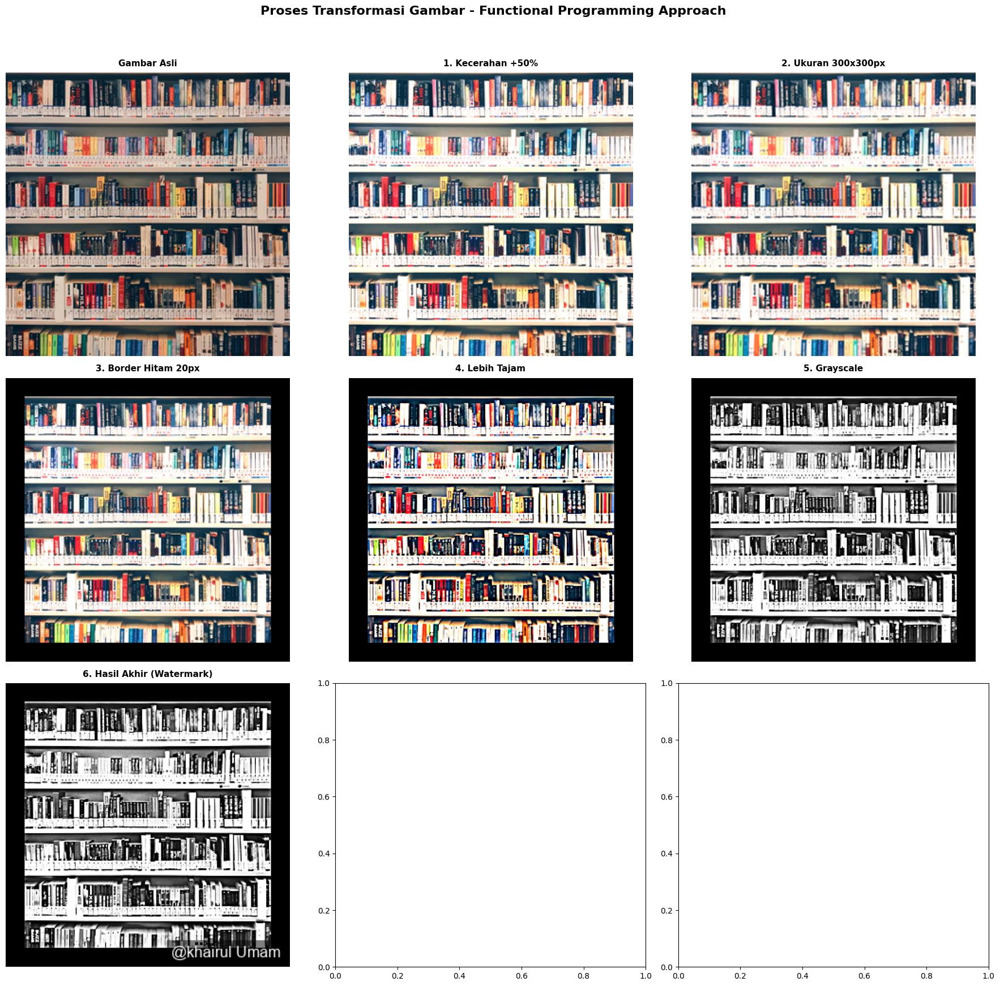

In [ ]:
# Higher-order function untuk membuat fungsi resize gambar untuk display
def create_resizer_for_display(target_size=300):
    def resize_for_display(img):
        img_copy = img.copy()
        w, h = img_copy.size
        
        if w == h:
            return img_copy.resize((target_size, target_size), Image.Resampling.LANCZOS)
        
        if w > h:
            new_w = target_size
            new_h = int(target_size * h / w)
        else:
            new_h = target_size
            new_w = int(target_size * w / h)
        
        resized = img_copy.resize((new_w, new_h), Image.Resampling.LANCZOS)
        
        square_img = Image.new('RGB', (target_size, target_size), (255, 255, 255))

        offset_x = (target_size - new_w) // 2
        offset_y = (target_size - new_h) // 2
        square_img.paste(resized, (offset_x, offset_y))
        
        return square_img
    
    return resize_for_display

def create_grid_plotter(rows=3, cols=3, figsize=(15, 15)):
    def plot_grid(images_data):
        fig, axes = plt.subplots(rows, cols, figsize=figsize)
        axes = axes.flatten() if rows * cols > 1 else [axes]
        
        def plot_single_image(idx, data):
            if idx < len(images_data) and idx < len(axes):
                ax = axes[idx]
                ax.imshow(data['image'])
                ax.set_title(data['title'], fontsize=11, fontweight='bold', pad=8)
                ax.axis('off')
            else:
                if idx < len(axes):
                    axes[idx].axis('off')
        
        list(map(lambda idx_data: plot_single_image(*idx_data), 
                 enumerate(images_data)))
        
        plt.suptitle('Proses Transformasi Gambar - Functional Programming Approach', 
                     fontsize=16, fontweight='bold', y=0.995)
        plt.tight_layout(rect=[0, 0.03, 1, 0.97])
        return fig
    
    return plot_grid

def prepare_images_for_display(all_steps, resizer_func):
    return [
        {
            'image': resizer_func(img),
            'title': title
        }
        for title, img in all_steps
    ]

resizer = create_resizer_for_display(target_size=300)

display_data = prepare_images_for_display(all_steps, resizer)

grid_plotter = create_grid_plotter(rows=3, cols=3, figsize=(18, 18))

fig = grid_plotter(display_data)
plt.show()